In [3]:
import numpy as np 
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
plt.style.use('ggplot')
%matplotlib inline
import plotly.offline as py
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode
init_notebook_mode(connected=False)
from wordcloud import WordCloud
from geopy.geocoders import Nominatim
from folium.plugins import HeatMap
import folium
from tqdm import tqdm
from keras.preprocessing.text import Tokenizer

from keras.models import Sequential
from keras.layers import Dense, Embedding, LSTM, SpatialDropout1D
from sklearn.model_selection import train_test_split
from nltk import word_tokenize
from sklearn.feature_extraction.text import TfidfVectorizer
import gensim
from collections import Counter
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import matplotlib.colors as mcolors
from sklearn.manifold import TSNE
from gensim.models import word2vec
import nltk
import seaborn as sb
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import r2_score
import warnings
warnings.filterwarnings('always')
warnings.filterwarnings('ignore')
import re
from nltk.corpus import stopwords
from sklearn.metrics.pairwise import linear_kernel
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from matplotlib import rcParams

In [ ]:
#from keras.preprocessing.sequence import pad_sequences

In [4]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [5]:
df=pd.read_csv("/content/drive/MyDrive/zomato.csv")

In [6]:
print("dataset contains {} rows and {} columns".format(df.shape[0],df.shape[1]))

dataset contains 51717 rows and 17 columns


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51717 entries, 0 to 51716
Data columns (total 17 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   url                          51717 non-null  object
 1   address                      51717 non-null  object
 2   name                         51717 non-null  object
 3   online_order                 51717 non-null  object
 4   book_table                   51717 non-null  object
 5   rate                         43942 non-null  object
 6   votes                        51717 non-null  int64 
 7   phone                        50509 non-null  object
 8   location                     51696 non-null  object
 9   rest_type                    51490 non-null  object
 10  dish_liked                   23639 non-null  object
 11  cuisines                     51672 non-null  object
 12  approx_cost(for two people)  51371 non-null  object
 13  reviews_list                 51

In [8]:
df.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1/5,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1/5,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8/5,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7/5,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8/5,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari


**Columns description**

- **url**
contains the url of the restaurant in the zomato website

- **address**
contains the address of the restaurant in Bengaluru

- **name**
contains the name of the restaurant

- **online_order**
whether online ordering is available in the restaurant or not

- **book_table**
table book option available or not

- **rate**
contains the overall rating of the restaurant out of 5

- **votes**
contains total number of rating for the restaurant as of the above mentioned date

- **phone**
contains the phone number of the restaurant

- **location**
contains the neighborhood in which the restaurant is located

- **rest_type**
restaurant type

- **dish_liked**
dishes people liked in the restaurant

- **cuisines**
food styles, separated by comma

- **approx_cost(for two people)**
contains the approximate cost for meal for two people

- **reviews_list**
list of tuples containing reviews for the restaurant, each tuple 

- **menu_item**
contains list of menus available in the restaurant

- **listed_in(type)**
type of meal

- **listed_in(city)**
contains the neighborhood in which the restaurant is listed


## [Exploratory data analysis](#3)

## [Which are the top restaurant chains in Bangaluru?]()<a id="4"></a> <br>


Text(0.5, 0, 'Number of outlets')

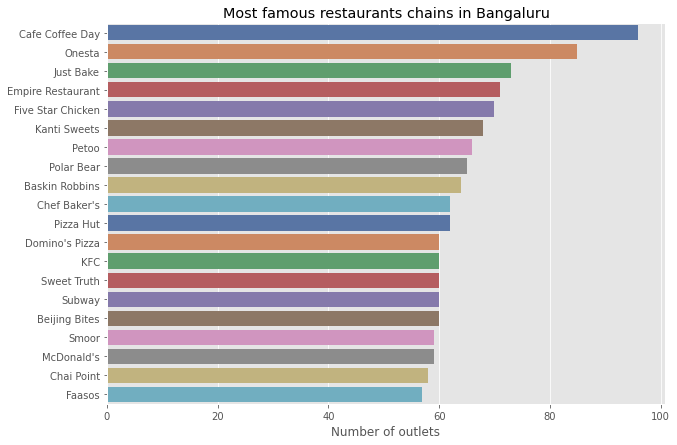

In [9]:
plt.figure(figsize=(10,7))
chains=df['name'].value_counts()[:20]
sns.barplot(x=chains,y=chains.index,palette='deep')
plt.title("Most famous restaurants chains in Bangaluru")
plt.xlabel("Number of outlets")

- As you can see **Cafe coffee day,Onesta,Just Bake** has the most number of outlets in and around bangalore.
- This is rather interesting,we will inspect each of them later.

## [How many of the restuarants do not accept online orders?]()<a id="5"></a> <br>


In [10]:
x=df['online_order'].value_counts()
colors = ['#FEBFB3', '#E1396C']

trace=go.Pie(labels=x.index,values=x,textinfo="value",
            marker=dict(colors=colors, 
                           line=dict(color='#000000', width=2)))
layout=go.Layout(title="Accepting vs not accepting online orders",width=500,height=500)
fig=go.Figure(data=[trace],layout=layout)
py.iplot(fig, filename='pie_chart_subplots')
    
    
    

1. As clearly indicated,almost 60 per cent of restaurants in Banglore accepts online orders.
2. Nearly 40 per cent of the restaurants do not accept online orders.
3. This might be because of the fact that these restaurants cannot afford to pay commission to zomoto for giving them orders online.
   zomato may want to consider giving them some more benefits if they want to increse the number of restaurants serving their customers online.


## [What is the ratio b/w restaurants that provide and do not provide table booking ?]()<a id="25"></a> <br>



In [11]:
x=df['book_table'].value_counts()
colors = ['#96D38C', '#D0F9B1']

trace=go.Pie(labels=x.index,values=x,textinfo="value",
            marker=dict(colors=colors, 
                           line=dict(color='#000000', width=2)))
layout=go.Layout(title="Table booking",width=500,height=500)
fig=go.Figure(data=[trace],layout=layout)
py.iplot(fig, filename='pie_chart_subplots')
    

1. Almost 90 percent of restaurants in Banglore do not provide table booking facility.
2. In India you cannot find table booking facility in any average restaurants,usually only five star restaurants provides table booking.
3. We will inspect this further.

## [Rating distribution]()<a id="6"></a> <br>


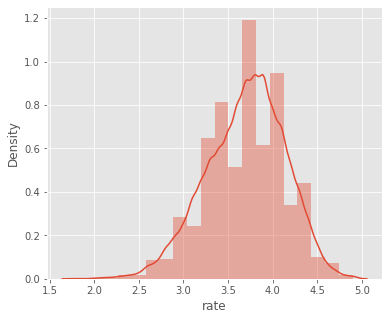

In [12]:
plt.figure(figsize=(6,5))
rating=df['rate'].dropna().apply(lambda x : float(x.split('/')[0]) if (len(x)>3)  else np.nan ).dropna()
sns.distplot(rating,bins=20)

1. Almost more than 50 percent of restaurants has rating between 3 and 4.
2. Restaurants having rating more than 4.5 are very rare.

In [13]:

cost_dist=df[['rate','approx_cost(for two people)','online_order']].dropna()
cost_dist['rate']=cost_dist['rate'].apply(lambda x: float(x.split('/')[0]) if len(x)>3 else 0)
cost_dist['approx_cost(for two people)']=cost_dist['approx_cost(for two people)'].apply(lambda x: int(x.replace(',','')))


## [Cost vs rating]()

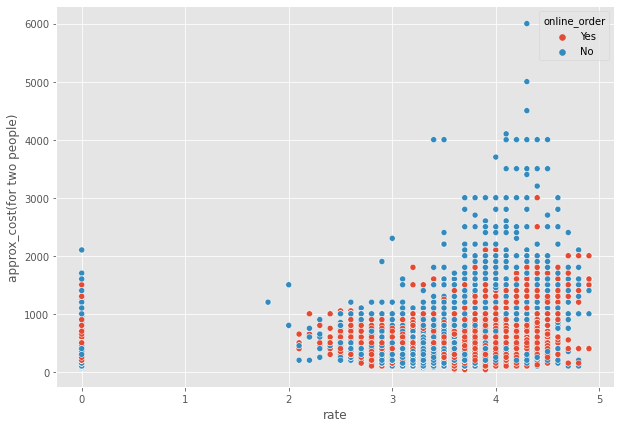

In [14]:
plt.figure(figsize=(10,7))
sns.scatterplot(x="rate",y='approx_cost(for two people)',hue='online_order',data=cost_dist)
plt.show()

- 

### [Distribution of cost for two people]()

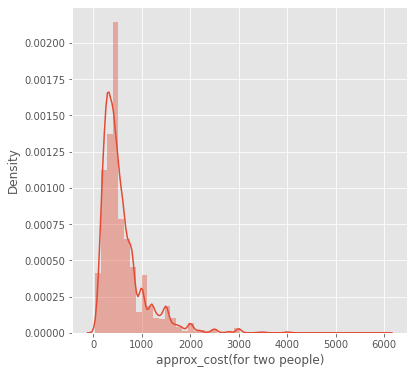

In [15]:
plt.figure(figsize=(6,6))
sns.distplot(cost_dist['approx_cost(for two people)'])
plt.show()

- We can see that the distribution if left skewed.
- This means almost 90percent of restaurants serve food for budget less than 1000 INR.($15)

## [Is there any difference b/w votes of restaurants accepting and not accepting online orders?]()<a id="7"></a> <br>


In [16]:


votes_yes=df[df['online_order']=="Yes"]['votes']
trace0=go.Box(y=votes_yes,name="accepting online orders",
              marker = dict(
        color = 'rgb(214, 12, 140)',
    ))

votes_no=df[df['online_order']=="No"]['votes']
trace1=go.Box(y=votes_no,name="Not accepting online orders",
              marker = dict(
        color = 'rgb(0, 128, 128)',
    ))

layout = go.Layout(
    title = "Box Plots of votes",width=800,height=500
)

data=[trace0,trace1]
fig=go.Figure(data=data,layout=layout)
py.iplot(fig)




1. Yes,you can observe that median number of votes for both categories vary.
2. Restaurants accepting online orders tend to get more votes from customers as there is a rating option poping up after each order through zomato application.

## [Which are the most common restaurant type in Banglore?]()<a id="8"></a> <br>


Text(0.5, 0, 'count')

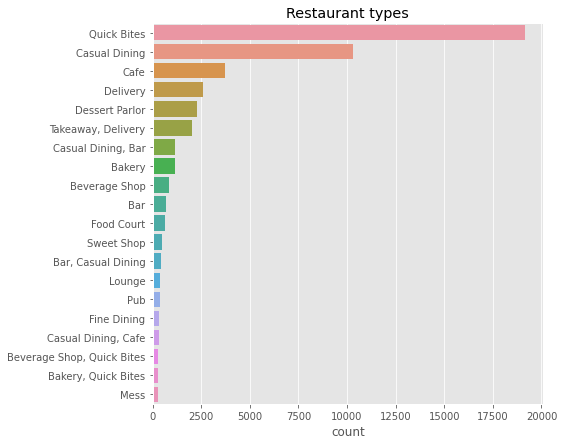

In [17]:
plt.figure(figsize=(7,7))
rest=df['rest_type'].value_counts()[:20]
sns.barplot(rest,rest.index)
plt.title("Restaurant types")
plt.xlabel("count")

1. No doubt about this as Banglore is known as the tech capital of India,people having busy and modern life will prefer Quick Bites.
2. We can observe tha Quick Bites type restaurants dominates.

## [Cost factor ?]()<a id="9"></a> <br>


In [18]:
trace0=go.Box(y=df['approx_cost(for two people)'],name="accepting online orders",
              marker = dict(
        color = 'rgb(214, 12, 140)',
    ))
data=[trace0]
layout=go.Layout(title="Box plot of approximate cost",width=800,height=500,yaxis=dict(title="Price"))
fig=go.Figure(data=data,layout=layout)
py.iplot(fig)

1. The median approximate cost for two people is 400 for a single meal.
2. 50 percent of restaurants charge between 300 and 650 for single meal for two people.


### [Finding Best budget Restaurants in any location]()

- I have implemented a simple filtering mechanism to find best budget restaurants in any locations in Bangalore.
- You can pass location and restaurant type as parameteres,function will return name of restaurants.


In [19]:
cost_dist=df[['rate','approx_cost(for two people)','location','name','rest_type']].dropna()
cost_dist['rate']=cost_dist['rate'].apply(lambda x: float(x.split('/')[0]) if len(x)>3 else 0)
cost_dist['approx_cost(for two people)']=cost_dist['approx_cost(for two people)'].apply(lambda x: int(x.replace(',','')))

In [20]:
def return_budget(location,rest):
    budget=cost_dist[(cost_dist['approx_cost(for two people)']<=400) & (cost_dist['location']==location) & 
                     (cost_dist['rate']>4) & (cost_dist['rest_type']==rest)]
    return(budget['name'].unique())

In [21]:
return_budget('BTM',"Quick Bites")

array(['Swadista Aahar', 'Litti Twist', 'The Shawarma Shop', 'Gorbandh',
       'Yum In My Tum', 'Chaatimes', "Muthashy's", 'Swad Punjab Da',
       "Domino's Pizza", 'Roti Wala', 'Andhra Kitchen'], dtype=object)

## [Which are the foodie areas?]()<a id="10"></a> <br>


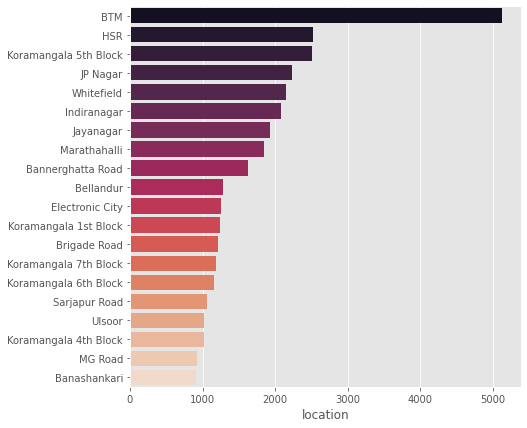

In [22]:
plt.figure(figsize=(7,7))
Rest_locations=df['location'].value_counts()[:20]
sns.barplot(Rest_locations,Rest_locations.index,palette="rocket")

1. We can see that **BTM,HSR and Koranmangala 5th block** has the most number of restaurants.
2. BTM dominates the section by having more than 5000 restaurants.

## [Which are the most common cuisines in each locations?]()<a id="11"></a> <br>


In [23]:
df_1=df.groupby(['location','cuisines']).agg('count')
data=df_1.sort_values(['url'],ascending=False).groupby(['location'],
                as_index=False).apply(lambda x : x.sort_values(by="url",ascending=False).head(3))['url'].reset_index().rename(columns={'url':'count'})


In [24]:

data.head(10)

,level_0,location,cuisines,count
0,0,BTM,"North Indian, Chinese",379
1,0,BTM,North Indian,340
2,0,BTM,Biryani,120
3,1,Banashankari,South Indian,86
4,1,Banashankari,"North Indian, Chinese",61
5,1,Banashankari,North Indian,36
6,2,Banaswadi,South Indian,37
7,2,Banaswadi,"North Indian, Chinese",24
8,2,Banaswadi,Biryani,23
9,3,Bannerghatta Road,"North Indian, Chinese",130


## [Extracting location information using Geopy]()<a id="12"></a> <br>


In [25]:
locations=pd.DataFrame({"Name":df['location'].unique()})
locations['Name']=locations['Name'].apply(lambda x: "Bangalore " + str(x))
lat_lon=[]
geolocator=Nominatim(user_agent="app")
for location in locations['Name']:
    location = geolocator.geocode(location)
    if location is None:
        lat_lon.append(np.nan)
    else:    
        geo=(location.latitude,location.longitude)
        lat_lon.append(geo)


locations['geo_loc']=lat_lon
locations.to_csv('locations.csv',index=False)

In [26]:
locations["Name"]=locations['Name'].apply(lambda x :  x.replace("Bangalore","")[1:])
locations.head()

,Name,geo_loc
0,Banashankari,"(12.965283249999999, 77.59445195)"
1,Basavanagudi,"(12.9417261, 77.5755021)"
2,Mysore Road,"(12.9357828, 77.51399)"
3,Jayanagar,"(12.9292731, 77.5824229)"
4,Kumaraswamy Layout,"(12.9081487, 77.5553179)"


- We have found out latitude and longitude of each location listed in the dataset using geopy.
- This is used to plot maps.

## [Heatmap of restaurant count on each location]()<a id="13"></a> <br>


In [27]:
Rest_locations=pd.DataFrame(df['location'].value_counts().reset_index())
Rest_locations.columns=['Name','count']
Rest_locations=Rest_locations.merge(locations,on='Name',how="left").dropna()
Rest_locations['count'].max()

5124

In [28]:
def generateBaseMap(default_location=[12.97, 77.59], default_zoom_start=12):
    base_map = folium.Map(location=default_location, control_scale=True, zoom_start=default_zoom_start)
    return base_map

In [29]:
lat,lon=zip(*np.array(Rest_locations['geo_loc']))
Rest_locations['lat']=lat
Rest_locations['lon']=lon
basemap=generateBaseMap()
HeatMap(Rest_locations[['lat','lon','count']].values.tolist(),zoom=20,radius=15).add_to(basemap)

In [30]:
basemap

1. It is clear that restaurants tend to concentrate in central bangalore area.
2. The clutter of restaurants lowers are we move away from central.
3. So,potential restaurant entrepreneurs can refer this and find out good locations for their venture.

## [Which are  the most popular cuisines of Bangalore?]()<a id="14"></a> <br>


Text(0.5, 1.0, 'Most popular cuisines of Bangalore')

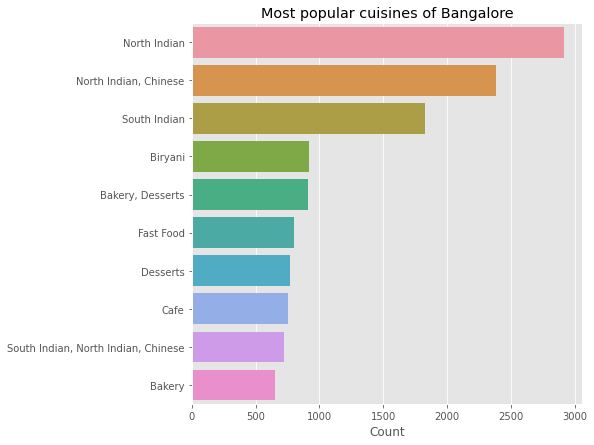

In [31]:
plt.figure(figsize=(7,7))
cuisines=df['cuisines'].value_counts()[:10]
sns.barplot(cuisines,cuisines.index)
plt.xlabel('Count')
plt.title("Most popular cuisines of Bangalore")

## [Heatmap of North Indian restaurants]()<a id="15"></a> <br>


In [32]:
def produce_data(col,name):
    data= pd.DataFrame(df[df[col]==name].groupby(['location'],as_index=False)['url'].agg('count'))
    data.columns=['Name','count']
    print(data.head())
    data=data.merge(locations,on="Name",how='left').dropna()
    data['lan'],data['lon']=zip(*data['geo_loc'].values)
    return data.drop(['geo_loc'],axis=1)



In [33]:
North_India=produce_data('cuisines','North Indian')

                Name  count
0                BTM    340
1       Banashankari     36
2          Banaswadi     12
3  Bannerghatta Road     75
4       Basavanagudi     21


In [34]:
basemap=generateBaseMap()
HeatMap(North_India[['lan','lon','count']].values.tolist(),zoom=20,radius=15).add_to(basemap)
basemap

1. Interesting to see a cluster of North Indian Restaurants in South Bangalore area !
2. This may indicate that these areas are more populated by North Indians.

## [What about South  Indian cuisines?]()<a id="16"></a> <br>


In [35]:
food=produce_data('cuisines','South Indian')
basemap=generateBaseMap()
HeatMap(food[['lan','lon','count']].values.tolist(),zoom=20,radius=15).add_to(basemap)
basemap

                Name  count
0                BTM    113
1       Banashankari     86
2          Banaswadi     37
3  Bannerghatta Road     48
4       Basavanagudi     89


1. They tend to span all over Bangalore.
2. South Indian cuisines tend to cluster near central Bangalore.

## [Analysing Restaurant chains]()<a id="17"></a> <br>
 

In [36]:
def produce_chains(name):
    data_chain=pd.DataFrame(df[df["name"]==name]['location'].value_counts().reset_index())
    data_chain.columns=['Name','count']
    data_chain=data_chain.merge(locations,on="Name",how="left").dropna()
    data_chain['lan'],data_chain['lon']=zip(*data_chain['geo_loc'].values)
    return data_chain[['Name','count','lan','lon']]


In [37]:
df_1=df.groupby(['rest_type','name']).agg('count')
datas=df_1.sort_values(['url'],ascending=False).groupby(['rest_type'],
                as_index=False).apply(lambda x : x.sort_values(by="url",ascending=False).head(3))['url'].reset_index().rename(columns={'url':'count'})


In [38]:
mapbox_access_token="pk.eyJ1Ijoic2hhaHVsZXMiLCJhIjoiY2p4ZTE5NGloMDc2YjNyczBhcDBnZnA5aCJ9.psBECQ2nub0o25PgHcU88w"


## [Which are the most popular casual dining restaurant chains?]()<a id="18"></a> <br>


In [39]:
casual=datas[datas['rest_type']=='Casual Dining']
casual

,level_0,rest_type,name,count
59,27,Casual Dining,Empire Restaurant,58
60,27,Casual Dining,Beijing Bites,48
61,27,Casual Dining,Mani's Dum Biryani,47


- We can see tht **Empire restaurant,Beijing bites and Mani's dum biriyani** are the most popular casual dining restaurant chains in Bangalore.
- We will inspect them further...

## [Where are their outlets located?]()<a id="19"></a> <br>


In [40]:
def produce_trace(data_chain,name):
        data_chain['text']=data_chain['Name']+'<br>'+data_chain['count'].astype(str)
        trace =  go.Scattermapbox(
           
                lat=data_chain['lan'],
                lon=data_chain['lon'],
                mode='markers',
                marker=go.scattermapbox.Marker(
                    size=data_chain['count']*4
                ),
                text=data_chain['text'],name=name
            )
        
        return trace

In [41]:

data=[] 
for row in casual['name']:
    data_chain=produce_chains(row) 
    trace_0=produce_trace(data_chain,row)
    data.append(trace_0)



layout = go.Layout(title="Casual Dining Restaurant chains locations around Banglore",
    autosize=True,
    hovermode='closest',
    mapbox=dict(
        accesstoken=mapbox_access_token,
        bearing=0,style="streets",
        center=dict(
            lat=12.96,
            lon=77.59
        ),
        pitch=0,
        zoom=10
    ),
)


fig = dict(data=data, layout=layout)
py.iplot(fig, filename='Montreal Mapbox')

1. We can see that **Mani's dum biriyani** restaurant has half of their restaurants in central Banglore.
2. ** Empire Restaurant** is present in all over Banglore.
3. **Mani's dum Biriyani** has 12 outlets in ulsoor,which is the most in a single location.

## [Top quick bites restaurant chains in Banglore]()<a id="20"></a> <br>


In [42]:
quick=datas[datas['rest_type']=='Quick Bites']
quick 

,level_0,rest_type,name,count
179,78,Quick Bites,Five Star Chicken,69
180,78,Quick Bites,Domino's Pizza,60
181,78,Quick Bites,McDonald's,59


- Surprisingly  ** Five star chicken** dominates in quick bites restaurant types overtaking famous **Domino's Pizza and McDonald's**.
- Five Star Chicken is a branch of Charoen Pokphand Group Foods, a Thai multinational conglomerate with over $12 billion business in Agro and Food       Industries. Five Star Chicken specialties in fried chicken.

## [Where are their outlets located?]()<a id="21"></a> <br>


In [43]:
data=[]  
for row in quick['name']:
    data_chain=produce_chains(row) 
    trace_0=produce_trace(data_chain,row)
    data.append(trace_0)



layout = go.Layout(title="Quick Bites Restaurant chains locations around Banglore",
    autosize=True,
    hovermode='closest',
    mapbox=dict(
        accesstoken=mapbox_access_token,
        bearing=0,style="streets",
        center=dict(
            lat=12.96,
            lon=77.59
        ),
        pitch=0,
        zoom=10
    ),
)


fig = dict(data=data, layout=layout)
py.iplot(fig, filename='Montreal Mapbox')

## [Top Cafes of Banglore?]()<a id="22"></a> <br>


In [44]:
cafe=datas[datas['rest_type']=='Cafe']
cafe

,level_0,rest_type,name,count
41,19,Cafe,Cafe Coffee Day,96
42,19,Cafe,Smally's Resto Cafe,54
43,19,Cafe,Mudpipe Cafe,39


- No surprises,Cafe coffee day restaurant dominated way over other cafe chains in Banglore.
- Cafe coffee day has 96 outlets in Banglore.
- Café Coffee Day was started as a retail restaurant in 1996. The first CCD outlet was set up on July 11, 1996, at Brigade Road, Bengaluru, Karnataka.


## [Where are their outlets located?]()<a id="23"></a> <br>


In [45]:
data=[]  
for row in cafe['name']:
    data_chain=produce_chains(row) 
    trace_0=produce_trace(data_chain,row)
    data.append(trace_0)



layout = go.Layout(title="Cafe Restaurant chains locations around Banglore",
    autosize=True,
    hovermode='closest',
    mapbox=dict(
        accesstoken=mapbox_access_token,
        bearing=0,style="streets",
        center=dict(
            lat=12.96,
            lon=77.59
        ),
        pitch=0,
        zoom=10
    ),
)


fig = dict(data=data, layout=layout)
py.iplot(fig, filename='Montreal Mapbox')

## [Wordcloud of dishes liked by cuisines.]()<a id="24"></a> <br>


In [46]:
df['dish_liked']=df['dish_liked'].apply(lambda x : x.split(',') if type(x)==str else [''])
#x=df.groupby('rest_type',as_index=False)['dish_liked'].agg('sum')
#x['dish_liked']=x['dish_liked'].apply(lambda x : list(filter(lambda a : a!='',x)))

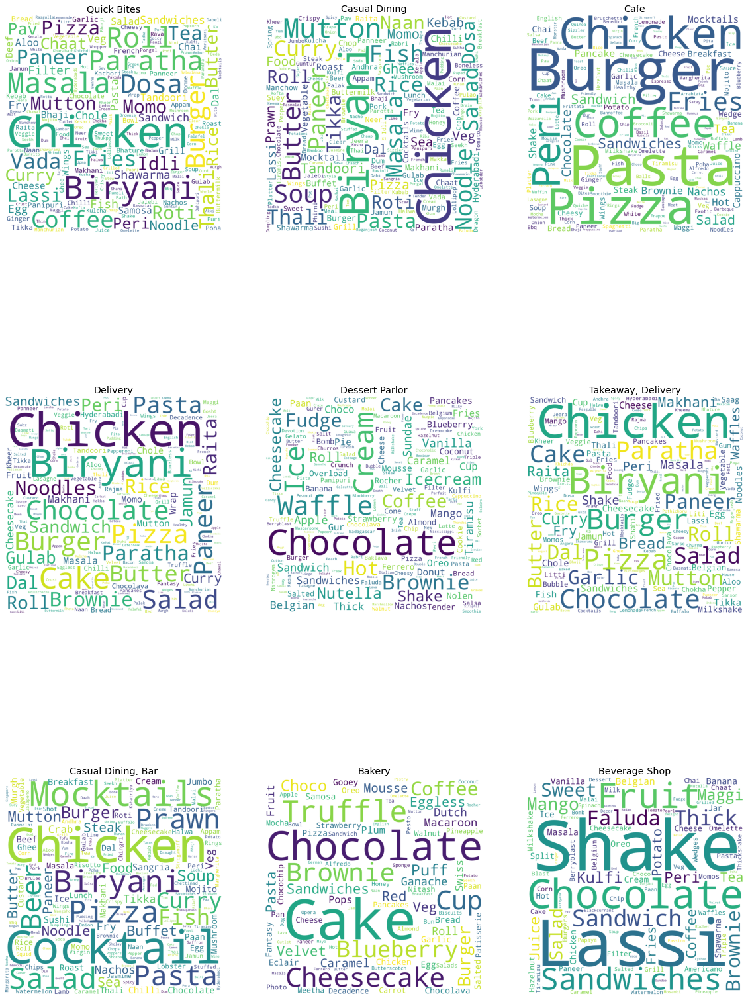

In [47]:
rest=df['rest_type'].value_counts()[:9].index
def produce_wordcloud(rest):
    
    plt.figure(figsize=(20,30))
    for i,r in enumerate(rest):
        plt.subplot(3,3,i+1)
        corpus=df[df['rest_type']==r]['dish_liked'].values.tolist()
        corpus=','.join(x  for list_words in corpus for x in list_words)
        wordcloud = WordCloud(max_font_size=None, background_color='white', collocations=False,
                      width=1500, height=1500).generate(corpus)
        plt.imshow(wordcloud)
        plt.title(r)
        plt.axis("off")
        

        
        
produce_wordcloud(rest)

## [Analysing Reviews]()<a id="26"></a><br>

- In this section we will go on to prepare reviews dataframe.
- We will extract reviews and ratings of each restaurant and create a dataframe with it.


In [48]:
all_ratings = []

for name,ratings in tqdm(zip(df['name'],df['reviews_list'])):
    ratings = eval(ratings)
    for score, doc in ratings:
        if score:
            score = score.strip("Rated").strip()
            doc = doc.strip('RATED').strip()
            score = float(score)
            all_ratings.append([name,score, doc])

51717it [00:32, 1583.93it/s]


In [49]:
import re

In [50]:
rating_df=pd.DataFrame(all_ratings,columns=['name','rating','review'])
rating_df['review']=rating_df['review'].apply(lambda x : re.sub('[^a-zA-Z0-9\s]',"",x))

In [51]:
rating_df.to_csv("Ratings.csv")

In [52]:
rating_df.head()

,name,rating,review
0,Jalsa,4.0,A beautiful place to dine inThe interiors take...
1,Jalsa,4.0,I was here for dinner with my family on a week...
2,Jalsa,2.0,Its a restaurant near to Banashankari BDA Me a...
3,Jalsa,4.0,We went here on a weekend and one of us had th...
4,Jalsa,5.0,The best thing about the place is its ambiance...


## [WordCloud of Reviews of restaurant chains]()<a id="27"></a><br>

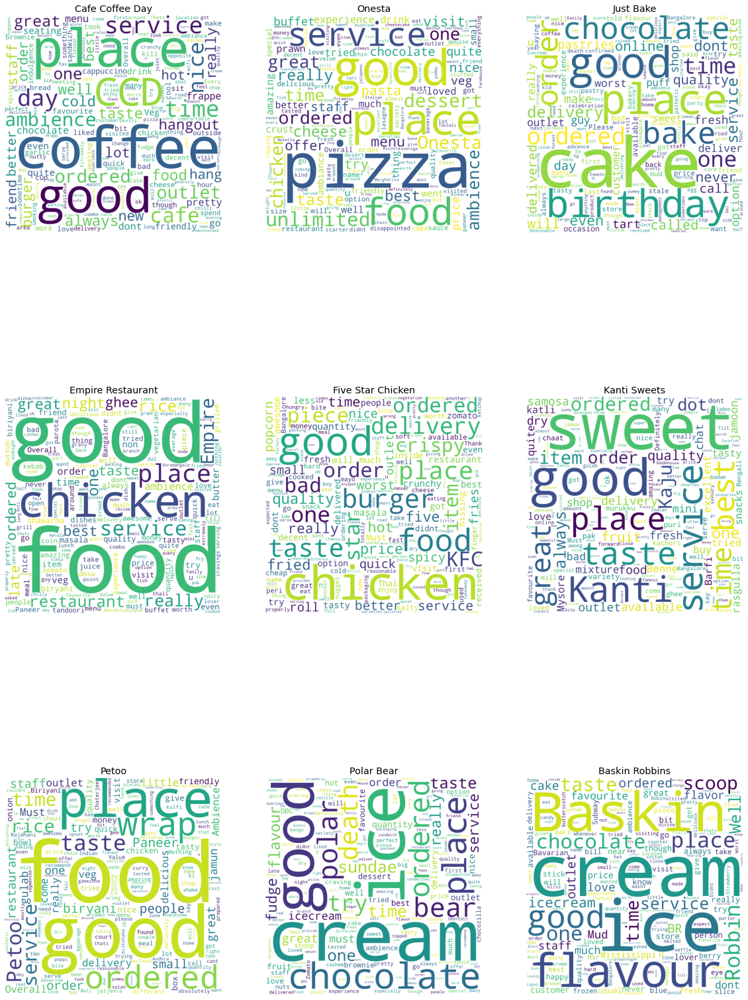

In [53]:
rest=df['name'].value_counts()[:9].index
def produce_wordcloud(rest):
    
    plt.figure(figsize=(20,30))
    for i,r in enumerate(rest):
        plt.subplot(3,3,i+1)
        corpus=rating_df[rating_df['name']==r]['review'].values.tolist()
        corpus=' '.join(x  for x in corpus)
        wordcloud = WordCloud(max_font_size=None, background_color='white', collocations=False,
                      width=1500, height=1500).generate(corpus)
        plt.imshow(wordcloud)
        plt.title(r)
        plt.axis("off")
        

        
        
produce_wordcloud(rest)

## [Rating distribution]()<a id="28" ></a><br>

Text(0, 0.5, 'count')

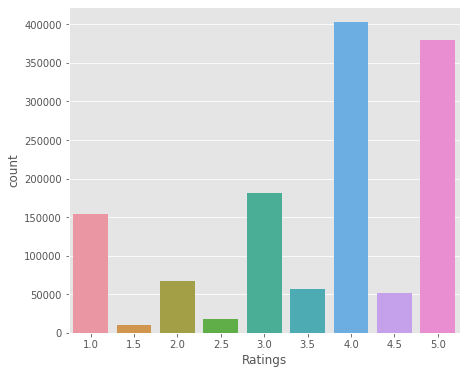

In [54]:
plt.figure(figsize=(7,6))
rating=rating_df['rating'].value_counts()
sns.barplot(x=rating.index,y=rating)
plt.xlabel("Ratings")
plt.ylabel('count')

In [55]:
##NLP


In [88]:
zomato = pd.read_csv('/content/drive/MyDrive/zomato.csv')
zomato.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1/5,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1/5,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8/5,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7/5,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8/5,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari


In [89]:
zomato.describe()

,votes
count,51717.000000
mean,283.697527
std,803.838853
min,0.000000
25%,7.000000
50%,41.000000
75%,198.000000
max,16832.000000


In [90]:
#Removing the null values
zomato.dropna(how = 'any', inplace = True)

In [91]:
#Dropping the columns which are not relevant
zomato=zomato.drop(['url','dish_liked','phone'],axis=1)

In [92]:
#Upadating few columns 
zomato = zomato.rename(columns={'approx_cost(for two people)':'cost','listed_in(type)':'type',
                                  'listed_in(city)':'city'})
zomato.columns

Index(['address', 'name', 'online_order', 'book_table', 'rate', 'votes',
       'location', 'rest_type', 'cuisines', 'cost', 'reviews_list',
       'menu_item', 'type', 'city'],
      dtype='object')

In [93]:
#Checking for duplicate values
zomato.duplicated().sum()

11

In [94]:
#Dropping the duplicate values
zomato.drop_duplicates(inplace = True)

In [95]:
#Simplifying the ratings column
#Removing '/5' from Rates
zomato['rate'].unique()
zomato = zomato.loc[zomato.rate !='NEW']
zomato = zomato.loc[zomato.rate !='-'].reset_index(drop=True)
remove_slash = lambda x: x.replace('/5', '') if type(x) == np.str else x
zomato.rate = zomato.rate.apply(remove_slash).str.strip().astype('float')

In [96]:
zomato['rate'].unique()

array([4.1, 3.8, 3.7, 4.6, 4. , 4.2, 3.9, 3. , 3.6, 2.8, 4.4, 3.1, 4.3,
       2.6, 3.3, 3.5, 3.2, 4.5, 2.5, 2.9, 3.4, 2.7, 4.7, 2.4, 2.2, 2.3,
       4.8, 4.9, 2.1, 2. , 1.8])

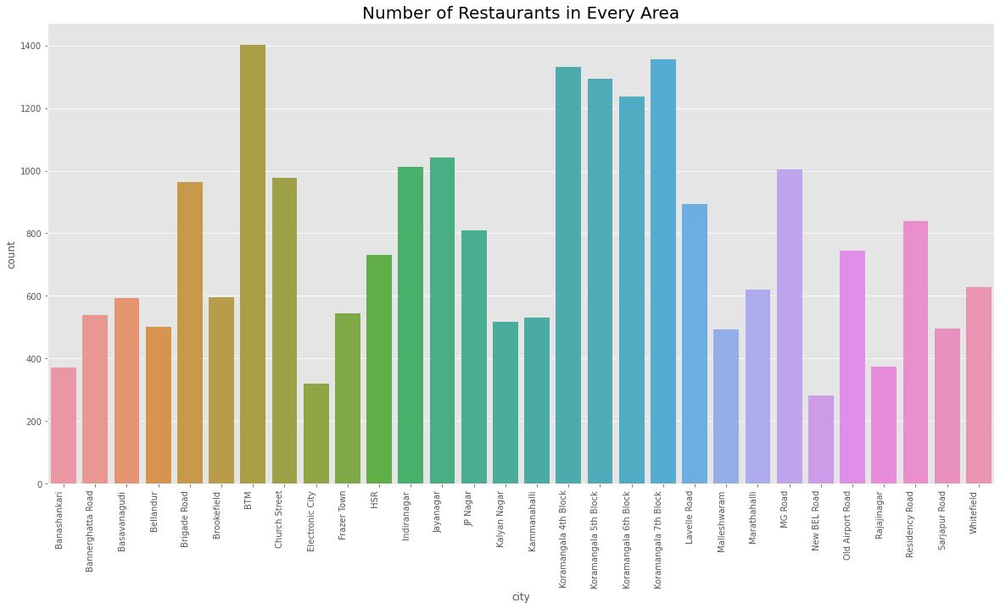

In [97]:
rcParams['figure.figsize'] = (20,10)
sb.countplot(zomato['city'])
sb.countplot(zomato['city']).set_xticklabels(sb.countplot(zomato['city']).get_xticklabels(), rotation=90, ha="right")
plt.title('Number of Restaurants in Every Area', size = 20)
plt.show()

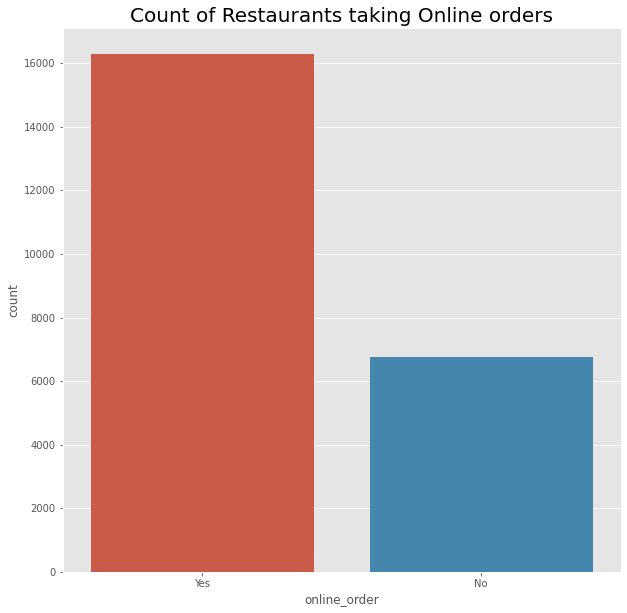

In [98]:
rcParams['figure.figsize'] = (10,10)
sb.countplot(zomato['online_order'])
plt.title('Count of Restaurants taking Online orders', size = 20)
plt.show()

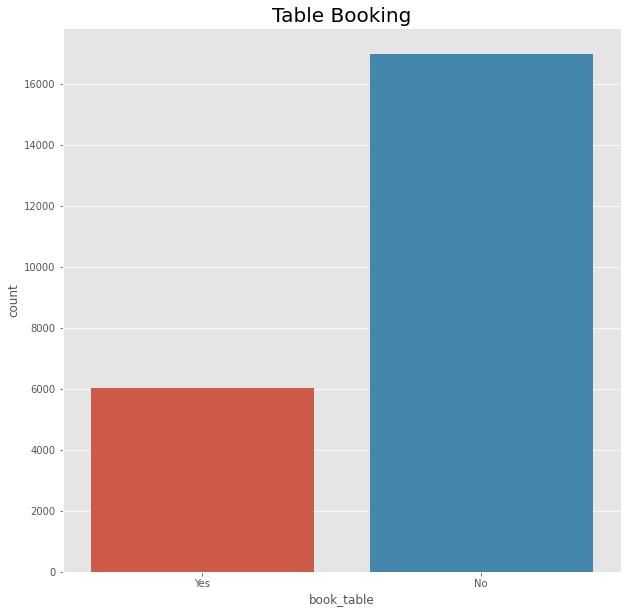

In [99]:
rcParams['figure.figsize'] = (10,10)
sb.countplot(zomato['book_table'])
plt.title('Table Booking', size = 20)
plt.show()

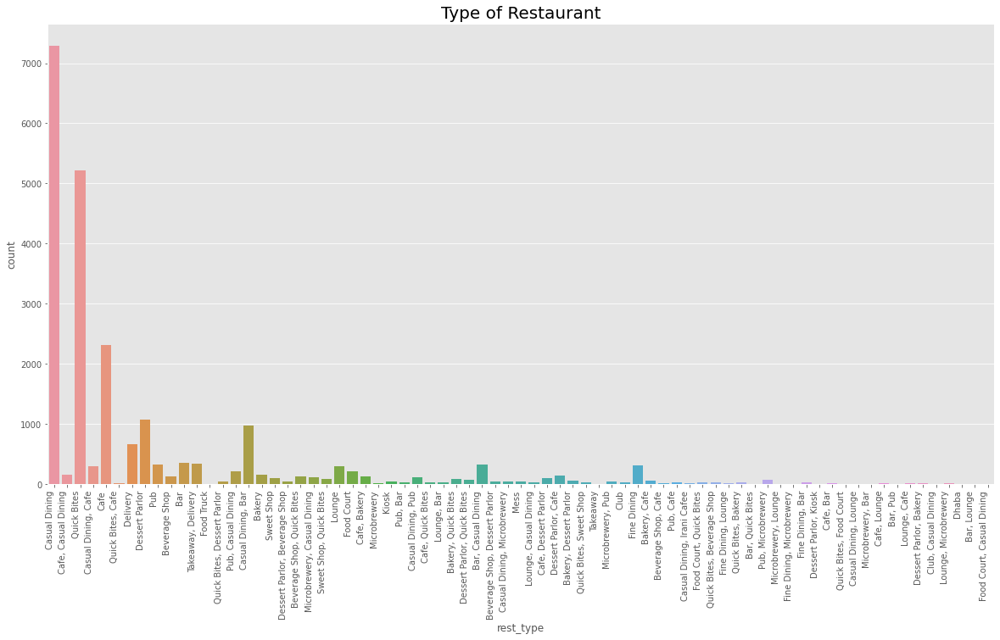

In [100]:
rcParams['figure.figsize'] = (20,10)
sb.countplot(zomato['rest_type'])
sb.countplot(zomato['rest_type']).set_xticklabels(sb.countplot(zomato['rest_type']).get_xticklabels(), rotation=90, ha="right")
plt.title('Type of Restaurant', size = 20)
plt.show()

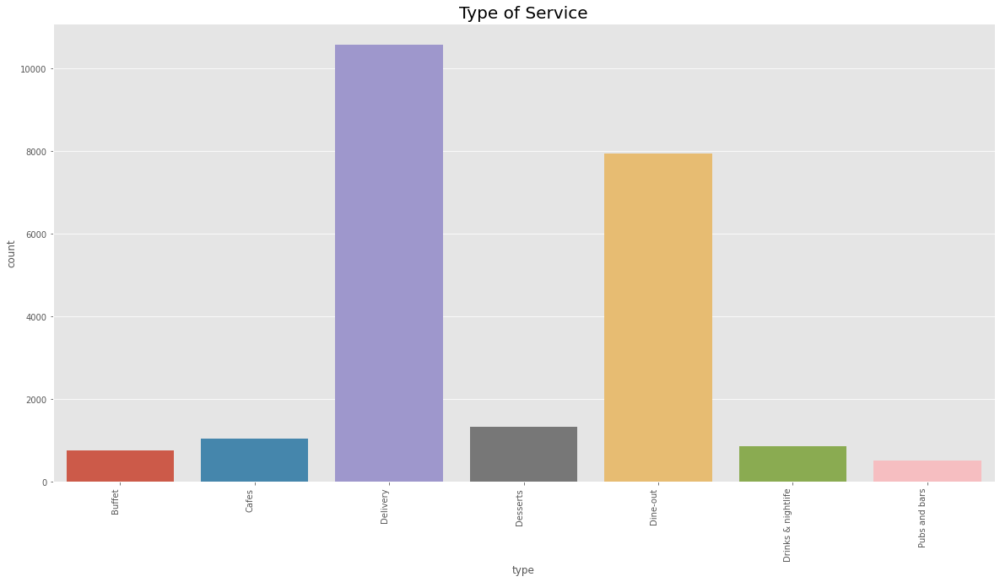

In [101]:
rcParams['figure.figsize'] = (20,10)
sb.countplot(zomato['type'])
sb.countplot(zomato['type']).set_xticklabels(sb.countplot(zomato['type']).get_xticklabels(), rotation=90, ha="right")
plt.title('Type of Service', size = 20)
plt.show()

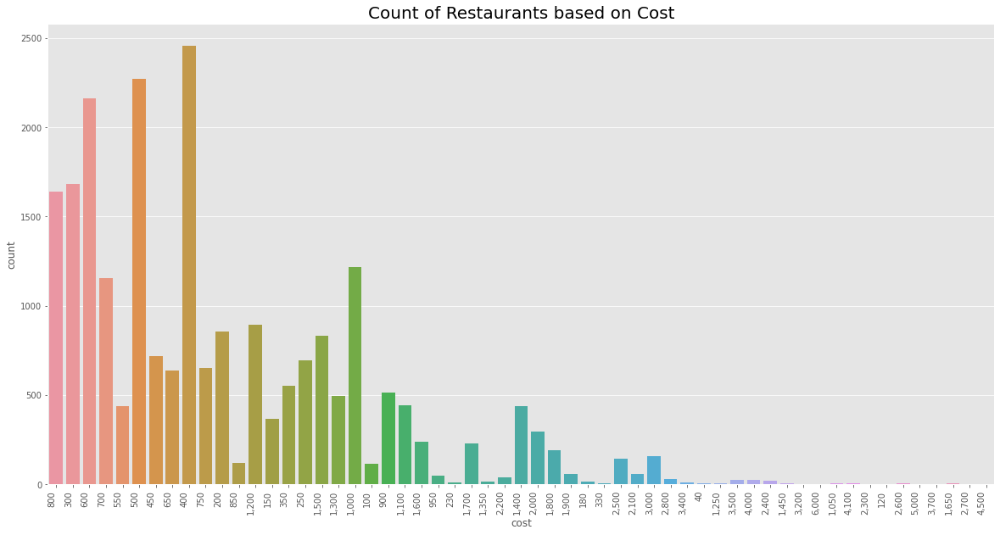

In [102]:
rcParams['figure.figsize'] = (20,10)
sb.countplot(zomato['cost'])
sb.countplot(zomato['cost']).set_xticklabels(sb.countplot(zomato['cost']).get_xticklabels(), rotation=90, ha="right")
plt.title('Count of Restaurants based on Cost', size = 20)
plt.show()

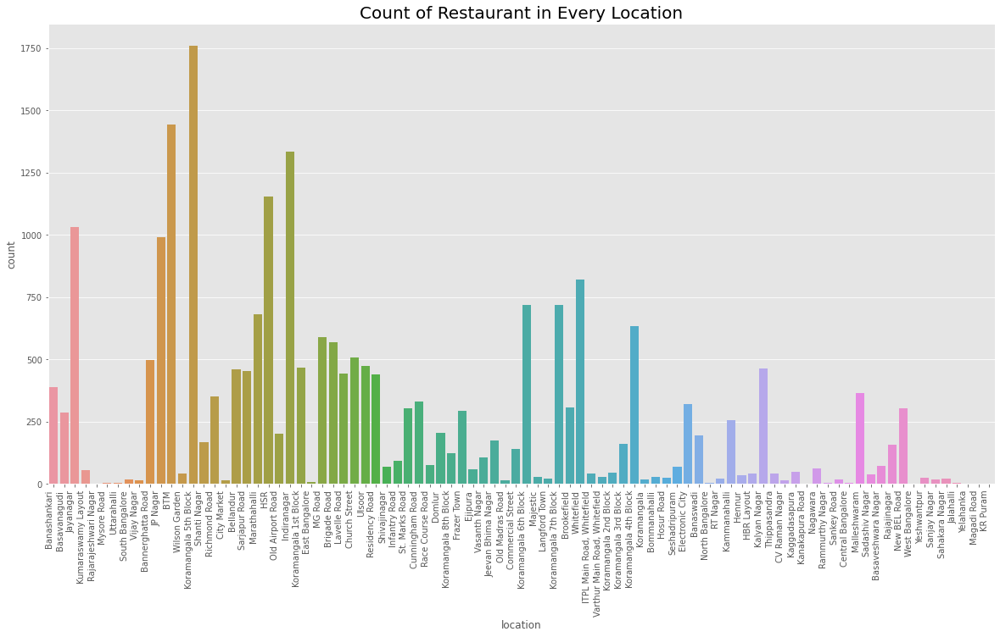

In [103]:
rcParams['figure.figsize'] = (20,10)
sb.countplot(zomato['location'])
sb.countplot(zomato['location']).set_xticklabels(sb.countplot(zomato['location']).get_xticklabels(), rotation=90, ha="right")
plt.title('Count of Restaurant in Every Location', size = 20)
plt.show()

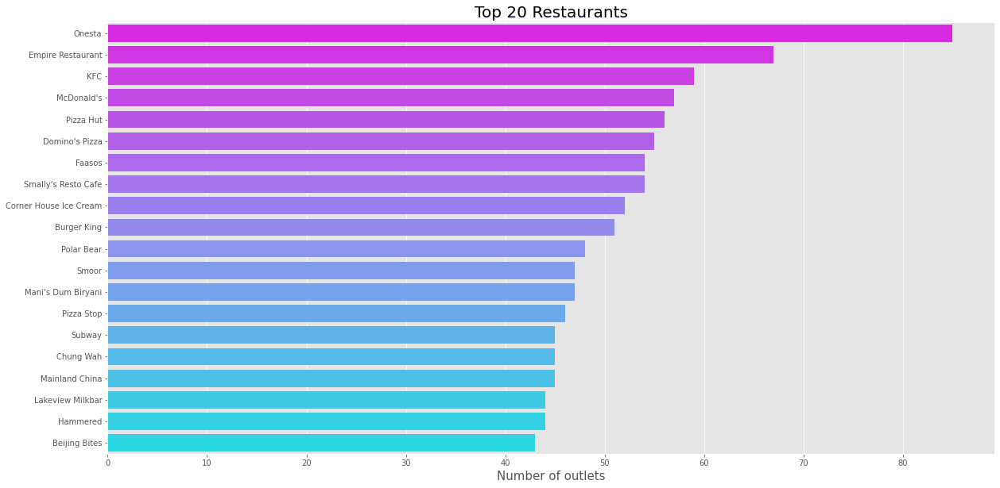

In [104]:
rcParams['figure.figsize'] = (20,10)
top = zomato['name'].value_counts()[:20]
sb.barplot(x = top, y = top.index, palette = 'cool_r')
plt.xlabel("Number of outlets",size=15)
plt.title('Top 20 Restaurants', size = 20)
plt.show()

In [105]:
#Cost Transformations
zomato['cost'] = zomato['cost'].astype(str)
zomato['cost'] = zomato['cost'].apply(lambda x: x.replace(',','.'))
zomato['cost'] = zomato['cost'].astype(float)

In [106]:
#Other Transformations
zomato.name = zomato.name.apply(lambda x:x.title())
zomato.online_order.replace(('Yes','No'),(True, False),inplace=True)
zomato.book_table.replace(('Yes','No'),(True, False),inplace=True)

In [107]:
#Encoding of input Variables
def Encode(zomato):
    for column in zomato.columns[~zomato.columns.isin(['rate', 'cost', 'votes'])]:
        zomato[column] = zomato[column].factorize()[0]
    return zomato

zomato_en = Encode(zomato.copy())

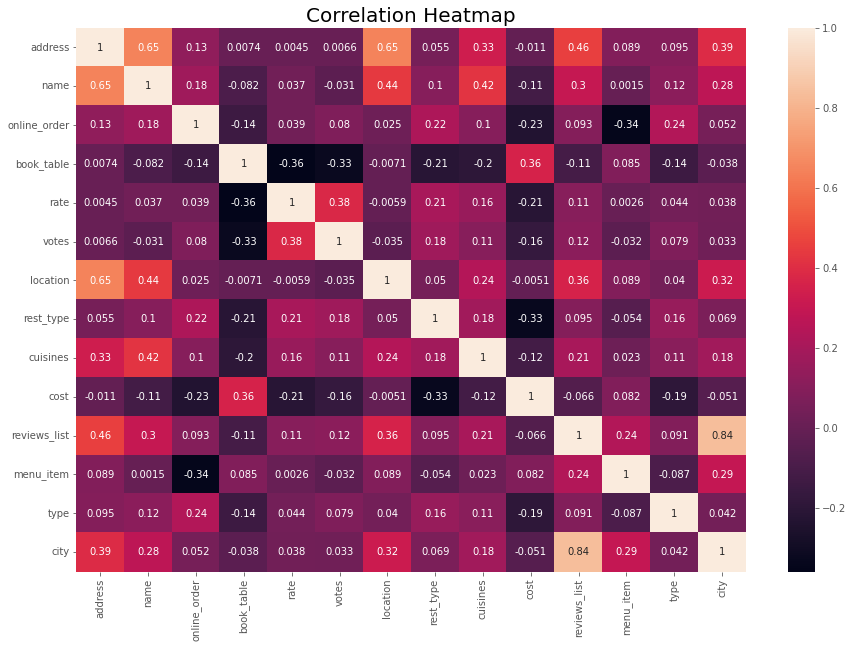

In [108]:
rcParams['figure.figsize'] = (15,10)
sb.heatmap(zomato_en.corr(), annot=True)
plt.title('Correlation Heatmap', size = 20)
plt.show()

# Regression Analysis

In [109]:
#Defining the independent variables and dependent variables
x = zomato_en.iloc[:,[2,3,5,6,7,8,9,11]]
y = zomato_en['rate']

In [110]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = .2)

In [111]:
#Preparing Random Forest Regression
from sklearn.ensemble import RandomForestRegressor
random = RandomForestRegressor(n_estimators=500)


In [112]:
#Preparing Random Forest Regression
from sklearn.ensemble import RandomForestRegressor
random = RandomForestRegressor(n_estimators=100)
random.fit(x_train,y_train)

RandomForestRegressor()

In [113]:
random.fit(x_train,y_train)

RandomForestRegressor()

In [114]:
print(" Accuracy :{}" .format(random.score(x_test, y_test)))

 Accuracy :0.9280927301373987


# SENTIMENTAL ANALYSIS

In [115]:
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer

In [116]:
# Selecting 5 sample reviews to analyse the intensity
restaurant_rev = zomato['reviews_list'].value_counts()
restaurant_rev.sample(5)

[('Rated 1.0', 'RATED\n  Why people think that as it is a home delivery and we can send what ever we can and surely customer can not do anything about it. Why it is so difficult for them to provide the same quality as in front of the shop and home delivery.\n\nTotally disappointed!!'), ('Rated 4.0', "RATED\n  Pocket friendly place good for smoothies , milk shakes has a wide no of choices taste so good. French fries my son's favourite. But sandwiches not really so tasty.. if want to enjoy milk shake definitely this place is for sure"), ('Rated 3.0', 'RATED\n  Ordered Chikku milk shake at this place and the packaging is done very nice. The quantity and quality is very good. The chikku milk shake is very tasty and yummy?'), ('Rated 4.0', 'RATED\n  Good place to have sandwiches and shakes if its month end and you are on a tight budget. You should definetly try Mississippi mud pie shake and fruit falooda.'), ('Rated 4.0', 'RATED\n  Taste and service is same as any other branch of Lassi shop

In [117]:
rev = ["Best place to take your family or the one you have a comfortable relationship with. A no-frills place serving good quality but not extraordinary food.",
      "Awesome place with good ambience and service food was superb , rabbidi was finger licking... A must try ",
      "Visited this place for lunch.. we opted ala carte.. let me remind you the place is quite expensive for the amount it serves. We ordered 2 naan, one malai kofta, 2 shikanji and the bill was 1250 bucks.",
      "I really did not like it.. it is far from fine dining.. it will just burn a hole in your pocket for no reason.",
      "I love the food, but when it comes cleanliness it is zero. Take away is good. But being a budget friendly place, i love it. I am not saying the food is amazing , but yeah it is good. They definitely need a revamp."]

In [119]:
import nltk
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...


True

In [120]:
sid = SentimentIntensityAnalyzer()
for sentence in rev:
    print(sentence)
    ss = sid.polarity_scores(sentence)
    for k in ss:
        print('{0}: {1}, '.format(k, ss[k]), end = '\n')
    print()

Best place to take your family or the one you have a comfortable relationship with. A no-frills place serving good quality but not extraordinary food.
neg: 0.0, 
neu: 0.749, 
pos: 0.251, 
compound: 0.6908, 

Awesome place with good ambience and service food was superb , rabbidi was finger licking... A must try 
neg: 0.0, 
neu: 0.539, 
pos: 0.461, 
compound: 0.9022, 

Visited this place for lunch.. we opted ala carte.. let me remind you the place is quite expensive for the amount it serves. We ordered 2 naan, one malai kofta, 2 shikanji and the bill was 1250 bucks.
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
compound: 0.0, 

I really did not like it.. it is far from fine dining.. it will just burn a hole in your pocket for no reason.
neg: 0.18, 
neu: 0.749, 
pos: 0.071, 
compound: -0.4164, 

I love the food, but when it comes cleanliness it is zero. Take away is good. But being a budget friendly place, i love it. I am not saying the food is amazing , but yeah it is good. They definitely need a rev